In [1]:
import datetime
import json
import os
from joblib import Parallel, delayed
from time import sleep, time
import logging

import itertools
import holidays
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn.feature_selection import RFE

from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout
from keras.optimizers import Adam
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

import plotly.express as px
import plotly.graph_objects as go


In [2]:
def preprocess_data(file_path):
    """
    Preprocess the dataset:
    1. Read the dataset from the given file path.
    2. Change column names to lower case and drop 'id' (row number) if present.
    3. Sort the dataframe by 'settlement_date' and 'settlement_period'.
    4. Check and display the count of NaN values in 'nsl_flow' and 'eleclink_flow' columns.
    5. Drop 'nsl_flow' and 'eleclink_flow' columns.
    6. Drop rows where 'settlement_period' value is greater than 48.
    7. Drop rows where 'tsd' is equal to 0.
    8. Reset the index.
    
    Parameters:
        file_path (str): File path to the dataset CSV file.
        
    Returns:
        pd.DataFrame: Preprocessed DataFrame.
    """
    # Read the dataset
    df = pd.read_csv(file_path, index_col=0)
    
    # Change column names to lower case and drop 'id' (row number)
    df.columns = df.columns.str.lower()
    
    # Sort values by 'settlement_date' and 'settlement_period'
    df.sort_values(by=["settlement_date", "settlement_period"], inplace=True, ignore_index=True)
    
    # Check NaN values in 'nsl_flow' and 'eleclink_flow' columns
    na_counts = pd.concat([df["nsl_flow"].isna().value_counts().to_frame(), df["eleclink_flow"].isna().value_counts().to_frame()], axis=1, ignore_index=True).rename(columns={0: "nsl_flow", 1: "eleclink_flow"})
    
    # Drop 'nsl_flow' and 'eleclink_flow' columns
    df.drop(columns=["nsl_flow", "eleclink_flow"], axis=1, inplace=True)
    
    # Drop rows where 'settlement_period' value is greater than 48
    df.drop(index=df[df["settlement_period"] > 48].index, inplace=True)
    
    # Drop rows where 'tsd' is equal to 0
    df = df[df['tsd'] != 0]
    
    # Reset index
    df.reset_index(drop=True, inplace=True)
    
    return df

file_path = "Dataset (historic_demand_2009_2023).csv"
df = preprocess_data(file_path)

In [3]:
# Define the label ranges
def categorize_energy_consumption(tsd):
    if tsd <= 20000:
        return 'Low consumption'
    elif tsd <= 40000:
        return 'Moderate consumption'
    else:
        return 'High consumption'

# Create the energy_consumption column
df['energy_consumption'] = df['tsd'].apply(categorize_energy_consumption)

In [4]:
def train_and_evaluate(X, y):
    # Split the data into training and testing sets (80% train, 20% test)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    
    # Initialize classifiers
    classifiers = {
        "Decision Tree": DecisionTreeClassifier(random_state=42),
        "Random Forest": RandomForestClassifier(random_state=42),
        "SVM": SVC(random_state=42),
    }
    
    results = {}  # Dictionary to store results
    
    for clf_name, clf in classifiers.items():
        # Train the model
        clf.fit(X_train, y_train)
        
        # Make predictions
        y_pred = clf.predict(X_test)
        
        # Calculate evaluation metrics
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred, average='weighted')
        recall = recall_score(y_test, y_pred, average='weighted')
        f1 = f1_score(y_test, y_pred, average='weighted')
        cm = confusion_matrix(y_test, y_pred)
        
        # Store results in dictionary
        results[clf_name] = {
            'accuracy': accuracy,
            'precision': precision,
            'recall': recall,
            'f1-score': f1,
            'confusion_matrix': cm
        }
        
        # Print evaluation metrics
        print(f"------- {clf_name} -------")
        print("Accuracy:", accuracy)
        print("Precision:", precision)
        print("Recall:", recall)
        print("F1-Score:", f1)
        print("Confusion Matrix:")
        print(cm)
        print("-------------------------\n")
    
    return results

# Example usage:
# Define your independent variables (X) and dependent variable (y)
X = df[['settlement_period', 'nd', 'england_wales_demand', 'embedded_wind_generation',
        'embedded_wind_capacity', 'embedded_solar_generation', 'embedded_solar_capacity',
        'non_bm_stor', 'pump_storage_pumping', 'ifa_flow', 'ifa2_flow', 'britned_flow',
        'moyle_flow', 'east_west_flow', 'nemo_flow', 'is_holiday']]
y = df['energy_consumption']

# Call the function
results = train_and_evaluate(X, y)


------- Decision Tree -------
Accuracy: 0.9944696404309471
Precision: 0.9944781449129563
Recall: 0.9944696404309471
F1-Score: 0.9944737356994499
Confusion Matrix:
[[10082     0    80]
 [    0   509    67]
 [   71    71 41377]]
-------------------------

------- Random Forest -------
Accuracy: 0.9961153529670667
Precision: 0.9960918531885101
Recall: 0.9961153529670667
F1-Score: 0.9960925020831644
Confusion Matrix:
[[10082     0    80]
 [    0   521    55]
 [   48    20 41451]]
-------------------------

------- SVM -------
Accuracy: 0.9835428746388044
Precision: 0.9832031132816216
Recall: 0.9835428746388044
F1-Score: 0.9829575480130073
Confusion Matrix:
[[ 9863     0   299]
 [    0   330   246]
 [  280    35 41204]]
-------------------------



### Classification Models Built With Feature Selection

In [5]:
def train_and_evaluate_with_feature_selection(X, y, num_features):
    # Split the data into training and testing sets (80% train, 20% test)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    
    # Initialize classifiers
    classifiers = {
        "Decision Tree": DecisionTreeClassifier(random_state=42),
        "Random Forest": RandomForestClassifier(random_state=42)
    }
    
    results = {}  # Dictionary to store results
    
    for clf_name, clf in classifiers.items():
        # Initialize RFE with the classifier
        rfe = RFE(estimator=clf, n_features_to_select=num_features, step=1)
        
        # Fit RFE to the training data
        rfe.fit(X_train, y_train)
        
        # Get the selected feature indices
        selected_features_indices = rfe.get_support(indices=True)
        
        # Get the names of the selected features
        selected_features = X.columns[selected_features_indices]
        
        # Transform the data to include only the selected features
        X_train_selected = rfe.transform(X_train)
        X_test_selected = rfe.transform(X_test)
        
        # Train the model with selected features
        clf.fit(X_train_selected, y_train)
        
        # Make predictions
        y_pred = clf.predict(X_test_selected)
        
        # Calculate evaluation metrics
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred, average='weighted')
        recall = recall_score(y_test, y_pred, average='weighted')
        f1 = f1_score(y_test, y_pred, average='weighted')
        cm = confusion_matrix(y_test, y_pred)
        
        # Store results in dictionary
        results[clf_name] = {
            'selected_features': selected_features,
            'accuracy': accuracy,
            'precision': precision,
            'recall': recall,
            'f1-score': f1,
            'confusion_matrix': cm
        }
        
        # Print evaluation metrics
        print(f"------- {clf_name} -------")
        print("Selected Features:", selected_features)
        print("Accuracy:", accuracy)
        print("Precision:", precision)
        print("Recall:", recall)
        print("F1-Score:", f1)
        print("Confusion Matrix:")
        print(cm)
        print("-------------------------\n")
    
    return results

# Example usage:
# Define your independent variables (X) and dependent variable (y)
X = df[['settlement_period', 'nd', 'england_wales_demand', 'embedded_wind_generation',
        'embedded_wind_capacity', 'embedded_solar_generation', 'embedded_solar_capacity',
        'non_bm_stor', 'pump_storage_pumping', 'ifa_flow', 'ifa2_flow', 'britned_flow',
        'moyle_flow', 'east_west_flow', 'nemo_flow', 'is_holiday']]
y = df['energy_consumption']

# Specify the number of features to select with RFE
num_features = 5

# Call the function
results = train_and_evaluate_with_feature_selection(X, y, num_features)


------- Decision Tree -------
Selected Features: Index(['nd', 'england_wales_demand', 'ifa_flow', 'ifa2_flow', 'moyle_flow'], dtype='object')
Accuracy: 0.9869108444801653
Precision: 0.986936748870602
Recall: 0.9869108444801653
F1-Score: 0.9869234779471445
Confusion Matrix:
[[ 9960     0   202]
 [    0   432   144]
 [  188   150 41181]]
-------------------------

------- Random Forest -------
Selected Features: Index(['nd', 'england_wales_demand', 'embedded_solar_capacity',
       'pump_storage_pumping', 'ifa_flow'],
      dtype='object')
Accuracy: 0.9907189467439769
Precision: 0.9906911792612306
Recall: 0.9907189467439769
F1-Score: 0.9907043259815245
Confusion Matrix:
[[10007     0   155]
 [    0   482    94]
 [  152    84 41283]]
-------------------------



In [ ]:
# Define your independent variables (X) and dependent variable (y)
X = df[['nd', 'england_wales_demand', 'embedded_solar_capacity', 'ifa_flow', 'moyle_flow']]
y = df['energy_consumption']

# One-hot encode the target variable
y_encoded = pd.get_dummies(y)

# Normalize the data
scaler = MinMaxScaler(feature_range=(0, 1))
X_scaled = scaler.fit_transform(X)

# Split the data into training and testing sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_encoded, test_size=0.2, random_state=42)

# Reshape the data for LSTM (samples, time steps, features)
n_features = X.shape[1]
X_train_lstm = X_train.reshape(X_train.shape[0], 1, n_features)
X_test_lstm = X_test.reshape(X_test.shape[0], 1, n_features)


# Define the LSTM model
model = Sequential()
model.add(LSTM(128, input_shape=(1, n_features), activation='relu', return_sequences=True))
model.add(Dropout(0.2))
model.add(LSTM(64, activation='relu', return_sequences=False))
model.add(Dropout(0.2))
model.add(Dense(3, activation='softmax'))  # 3 output classes for 'Low', 'Moderate', 'High'

# Compile the model
adam = Adam(learning_rate=0.001)  # Corrected learning rate parameter
model.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(X_train_lstm, y_train, epochs=10, batch_size=32, validation_data=(X_test_lstm, y_test))

# Make predictions
y_pred = model.predict(X_test_lstm)

# Convert predictions back to categories
y_pred_categories = np.argmax(y_pred, axis=1)
y_test_categories = np.argmax(np.array(y_test), axis=1)

# Calculate accuracy
accuracy = accuracy_score(y_test_categories, y_pred_categories)
print("Accuracy:", accuracy)

# Plot training loss and validation loss
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

# Confusion matrix
conf_matrix = confusion_matrix(y_test_categories, y_pred_categories)
print("Confusion Matrix:")
print(conf_matrix)

# Classification report
class_report = classification_report(y_test_categories, y_pred_categories)
print("Classification Report:")
print(class_report)

Root Mean Squared Error (RMSE): 739.3445008441287


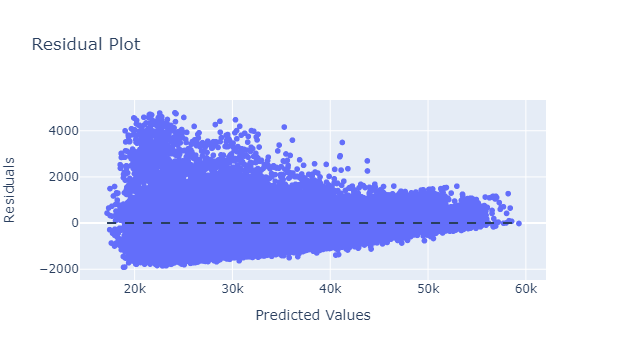

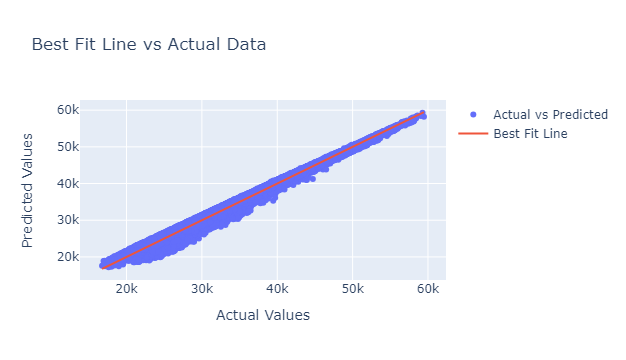

In [7]:
# Select independent and dependent variables
df = df[df['tsd'] != 0]

X = df[['nd', 'england_wales_demand', 'embedded_solar_capacity', 'ifa_flow', 'moyle_flow']]
y = df['tsd']

# Split the data into training and testing sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit the Multiple Linear Regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Calculate RMSE
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print("Root Mean Squared Error (RMSE):", rmse)

# Create a residual plot
residuals = y_test - y_pred
fig_res = px.scatter(x=y_pred, y=residuals, title="Residual Plot",
                     labels={'x': 'Predicted Values', 'y': 'Residuals'})
fig_res.add_shape(
    type="line", line=dict(dash='dash'),
    x0=y_pred.min(), y0=0, x1=y_pred.max(), y1=0
)

# Create a best fit line versus actual data plot
fig_best_fit = go.Figure()
fig_best_fit.add_trace(go.Scatter(x=y_test, y=y_pred, mode='markers', name='Actual vs Predicted'))
fig_best_fit.add_trace(go.Scatter(x=[y_test.min(), y_test.max()], y=[y_test.min(), y_test.max()], mode='lines', name='Best Fit Line'))

fig_best_fit.update_layout(title="Best Fit Line vs Actual Data",
                           xaxis_title="Actual Values",
                           yaxis_title="Predicted Values")

# Show the plots
fig_res.show()
fig_best_fit.show()
